In [1]:
%matplotlib inline
import sys
sys.path.insert(1, '../src/')

In [2]:
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
#import missingno as msno
from scipy.stats import mode
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from collections import defaultdict
from scipy.stats.stats import pearsonr

In [3]:
import cleaning as cl
%load_ext autoreload
%autoreload 2

In [4]:
df = pd.read_csv('../data/training.csv') 

In [5]:
cl.cleaning(df)

# Graphics with WarrantyCost, MMRAcquisitionAuctionAveragePrice and VehBCost

In [6]:
X = df[["WarrantyCost", "MMRAcquisitionAuctionAveragePrice", "VehBCost"]]

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

For all hierarchical methods we use the same distance metric: euclidean

In [7]:
data_dist = pdist(X, metric='euclidean')

<b>First hierarchical method: complete</b>

In [8]:
data_link = linkage(data_dist, method='complete', metric='euclidean')

If we assume the theshold equal to 7, we will have TWO clusters

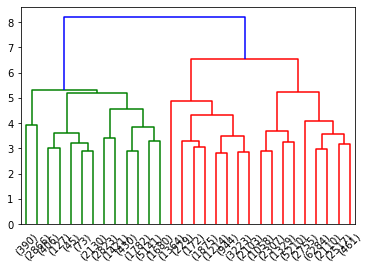

In [9]:
res = dendrogram(data_link, color_threshold=7, truncate_mode='lastp')

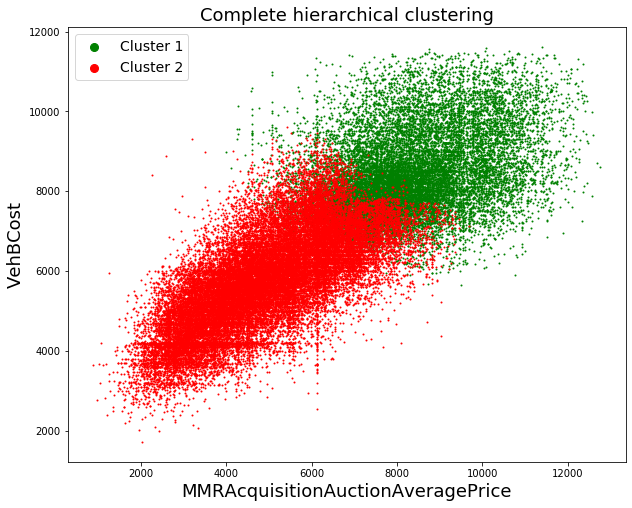

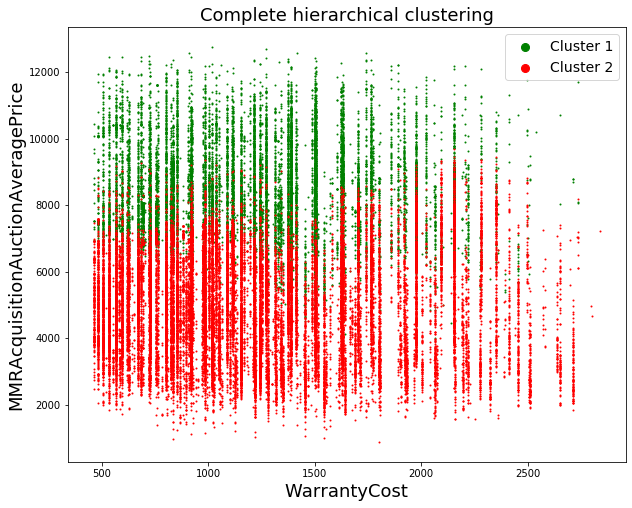

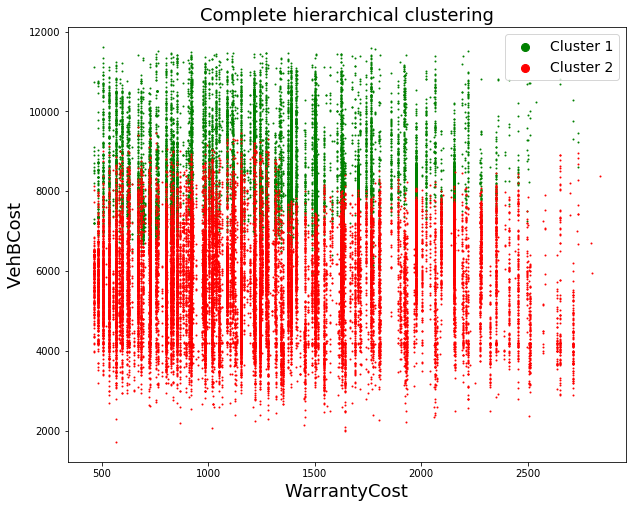

In [17]:
max_d = 7
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper left", fontsize = 14, markerscale = 8)    
plt.show()
# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()
# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

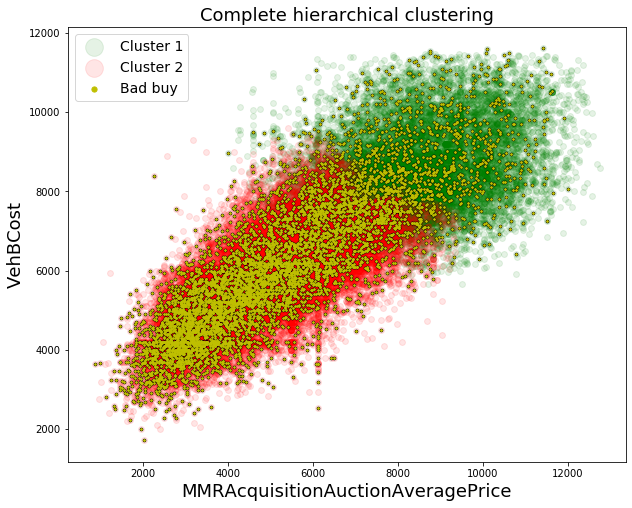

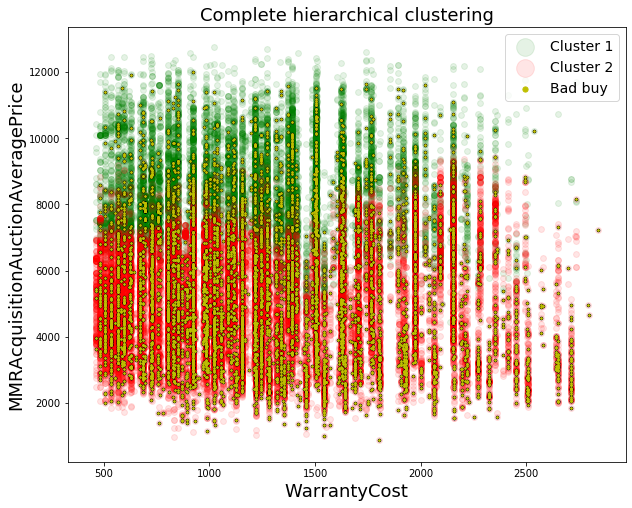

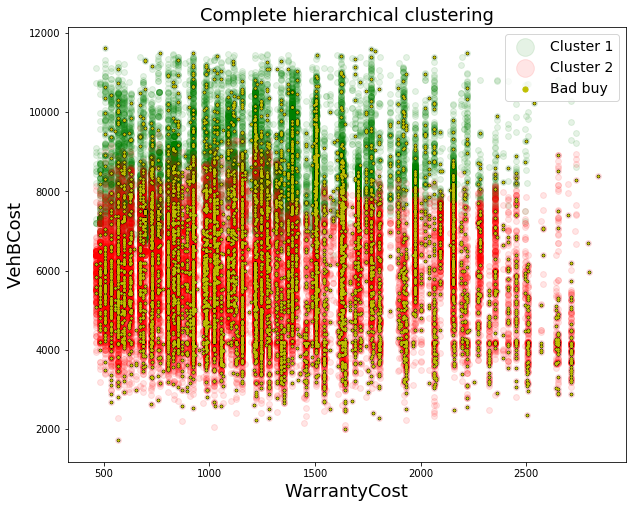

In [22]:
max_d = 7
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()
# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()
# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [25]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 19314 points
In details: 17686 good buys, and 1628 bad buys
So 8.43% of all the points of the cluster 1 are bad buys
This 1628 bad buys are 24.56% of all bad buys in the dataset

Cluster 2 has in total 35155 points
In details: 30155 good buys, and 5000 bad buys
So 14.22% of all the points of the cluster 2 are bad buys
This 5000 bad buys are 75.44% of all bad buys in the dataset



If we assume the theshold equal to 6, we will have THREE clusters

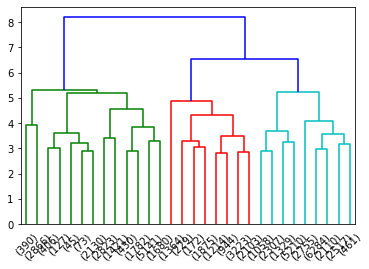

In [63]:
res = dendrogram(data_link, color_threshold=6, truncate_mode='lastp')

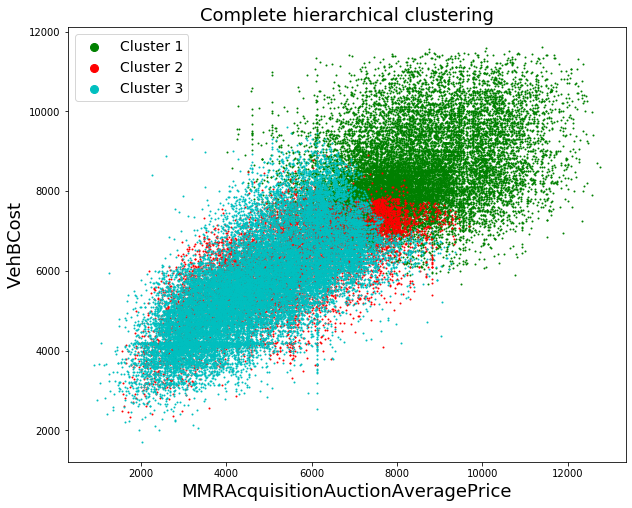

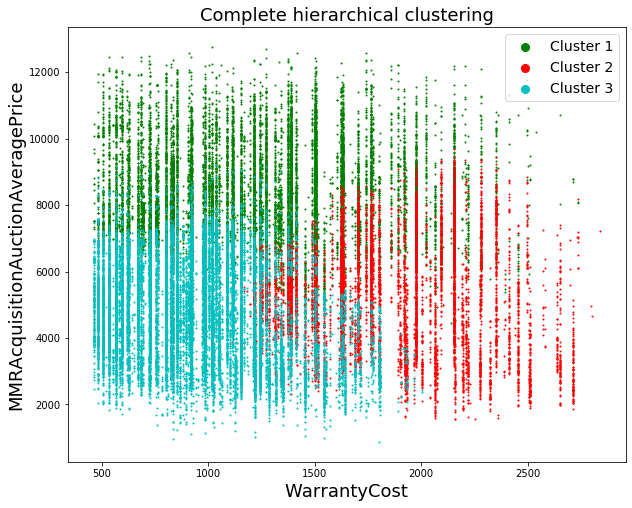

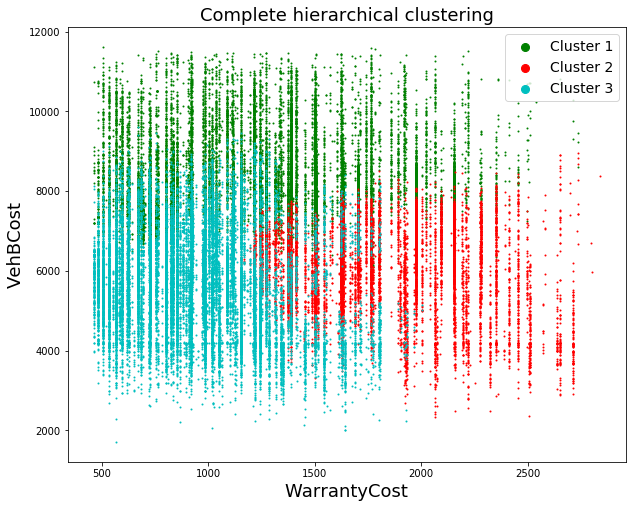

In [32]:
max_d = 6
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper left", fontsize = 14, markerscale = 8)    
plt.show()
# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()
# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

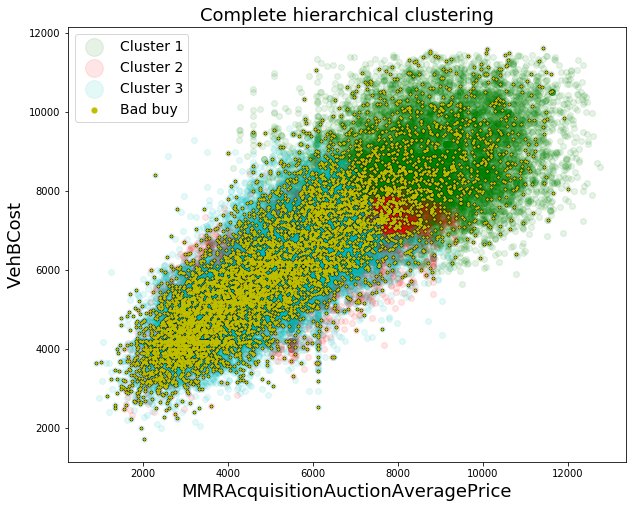

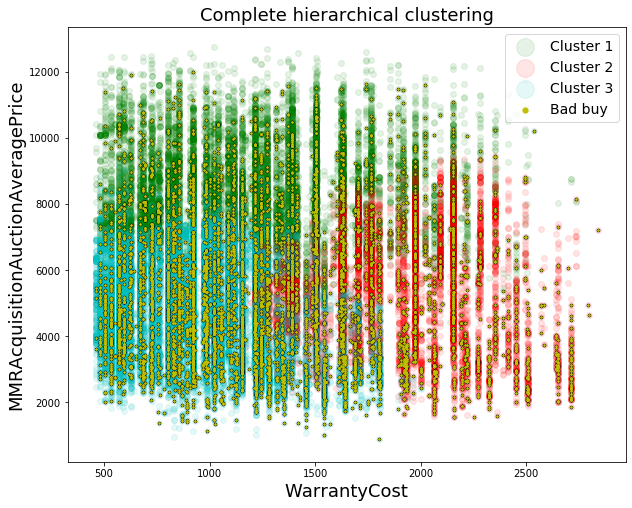

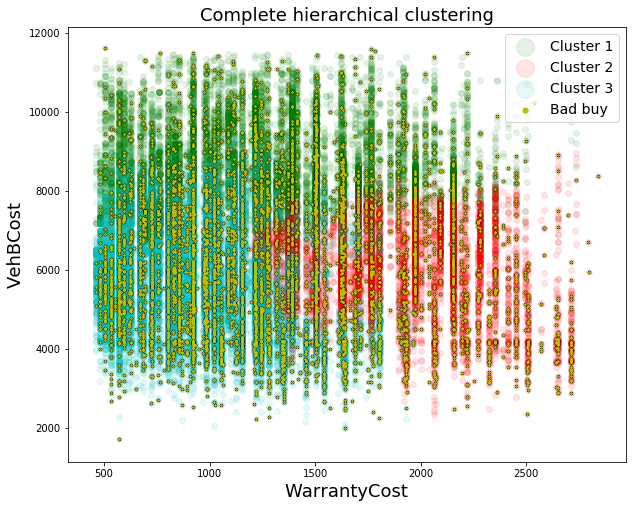

In [33]:
max_d = 6
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()
# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()
# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [35]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 19314 points
In details: 17686 good buys, and 1628 bad buys
So 8.43% of all the points of the cluster 1 are bad buys
This 1628 bad buys are 24.56% of all bad buys in the dataset

Cluster 2 has in total 11124 points
In details: 9489 good buys, and 1635 bad buys
So 14.70% of all the points of the cluster 2 are bad buys
This 1635 bad buys are 24.67% of all bad buys in the dataset

Cluster 3 has in total 24031 points
In details: 20666 good buys, and 3365 bad buys
So 14.00% of all the points of the cluster 3 are bad buys
This 3365 bad buys are 50.77% of all bad buys in the dataset



<b>Second hierarchical method: single</b>

In [8]:
data_link = linkage(data_dist, method='single', metric='euclidean')

With single method we have ONE cluster

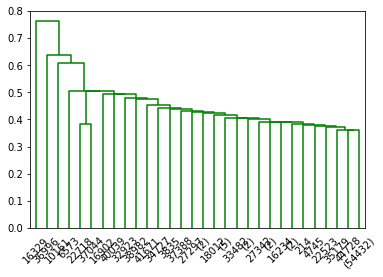

In [9]:
res = dendrogram(data_link, color_threshold=1.0, truncate_mode='lastp')

<b>Third hierarchical method: average</b>

In [36]:
data_link = linkage(data_dist, method='average', metric='euclidean')

If we assume the theshold equal to 2.5, we will have TWO clusters

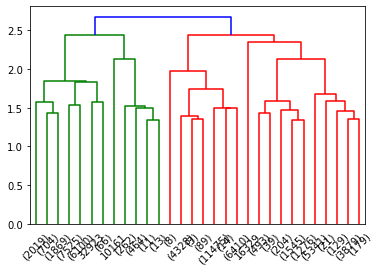

In [37]:
res = dendrogram(data_link, color_threshold=2.5, truncate_mode='lastp')

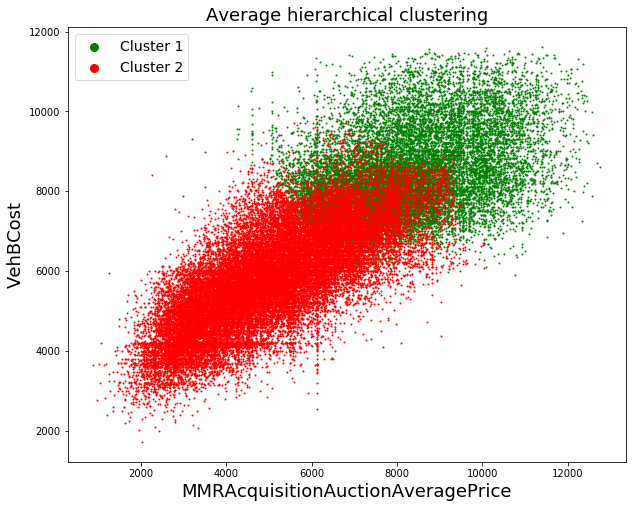

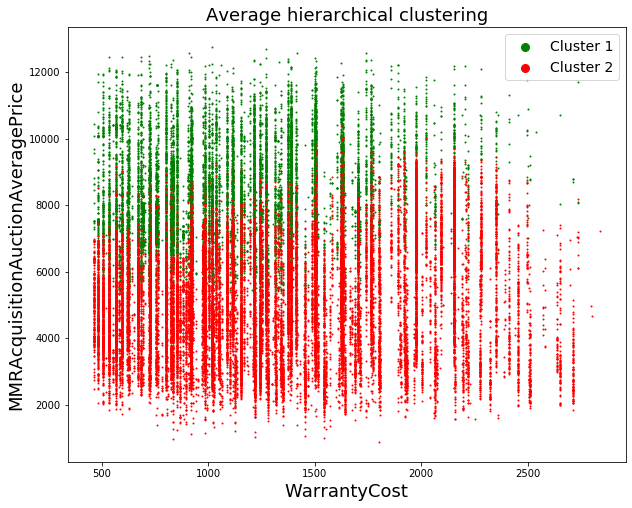

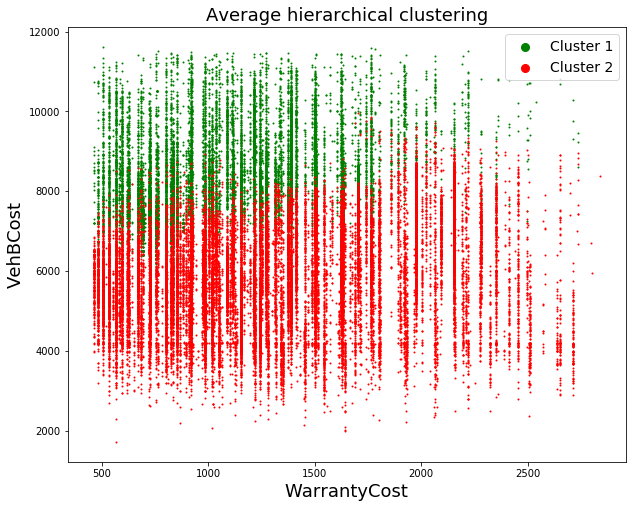

In [38]:
max_d = 2.5
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper left", fontsize = 14, markerscale = 8)    
plt.show()
# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()
# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

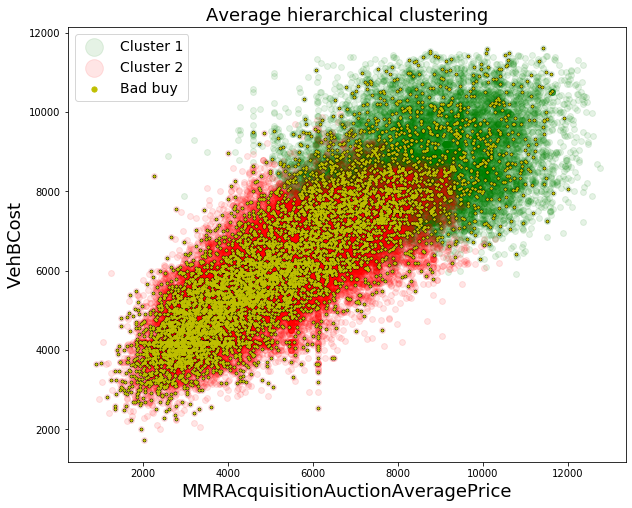

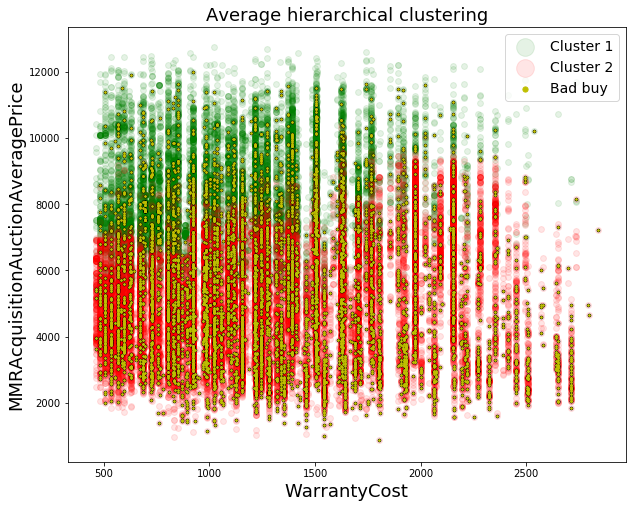

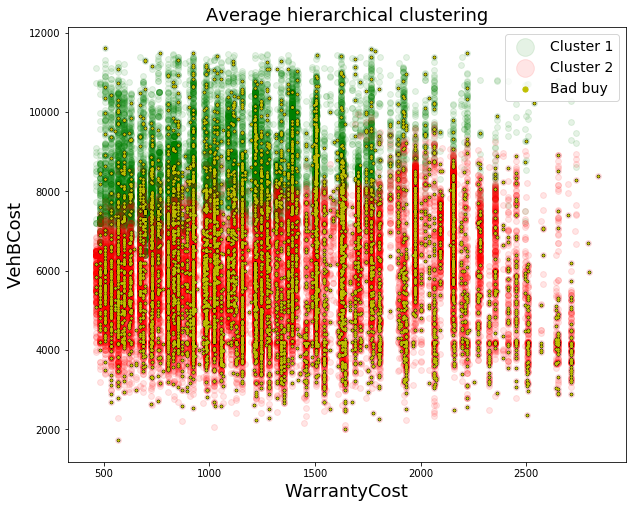

In [39]:
max_d = 2.5
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()
# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()
# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [40]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 19035 points
In details: 17383 good buys, and 1652 bad buys
So 8.68% of all the points of the cluster 1 are bad buys
This 1652 bad buys are 24.92% of all bad buys in the dataset

Cluster 2 has in total 35434 points
In details: 30458 good buys, and 4976 bad buys
So 14.04% of all the points of the cluster 2 are bad buys
This 4976 bad buys are 75.08% of all bad buys in the dataset



If we assume the theshold equal to 2.4, we will have FOUR clusters

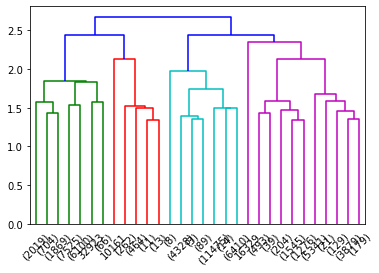

In [41]:
res = dendrogram(data_link, color_threshold=2.4, truncate_mode='lastp')

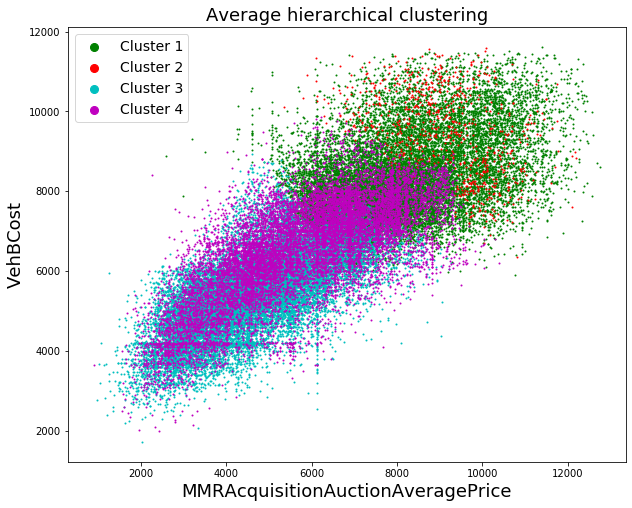

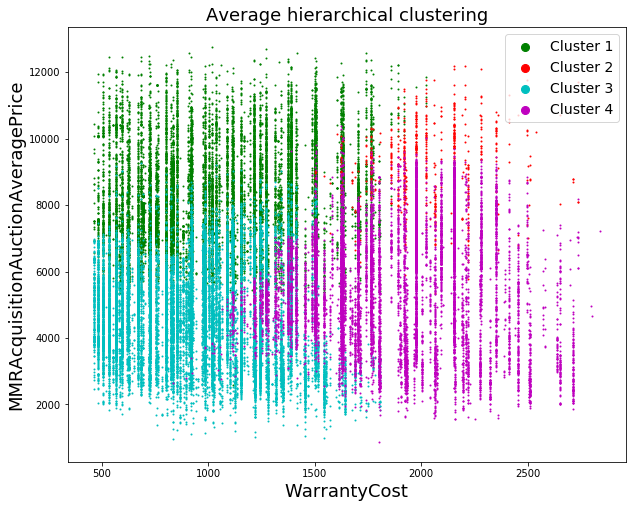

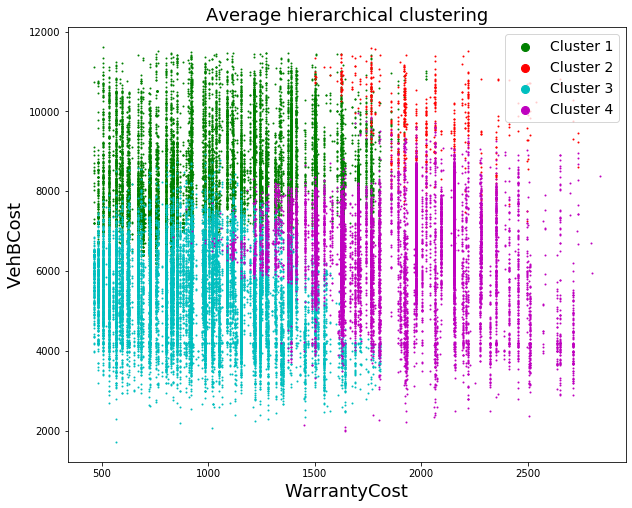

In [42]:
max_d = 2.4
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper left", fontsize = 14, markerscale = 8)    
plt.show()
# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()
# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

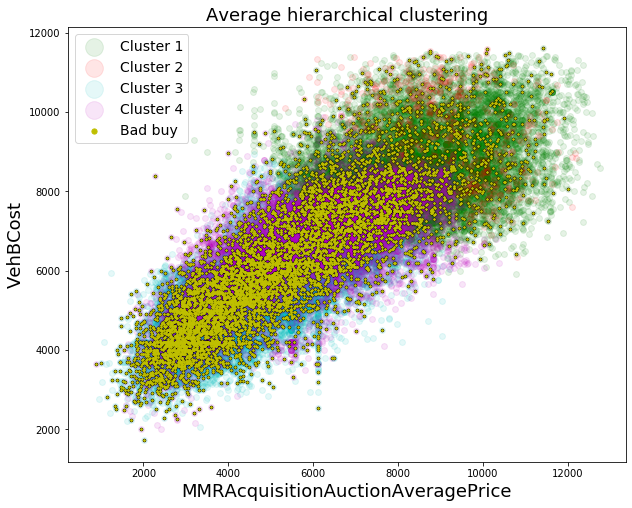

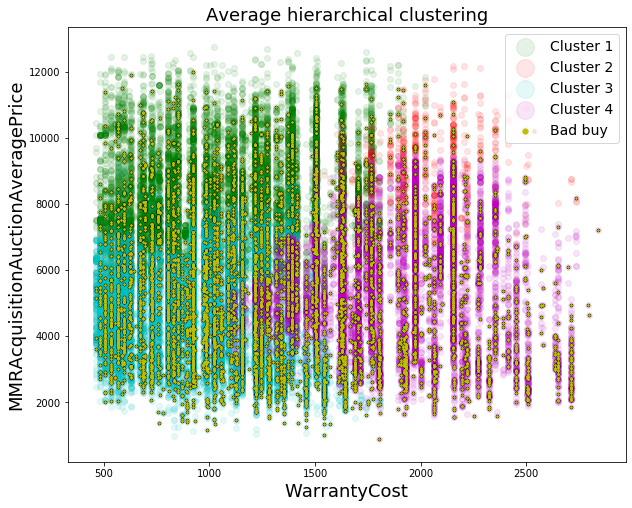

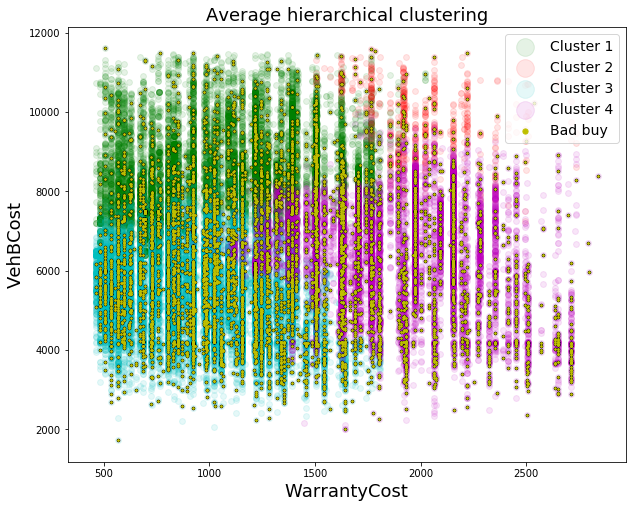

In [45]:
max_d = 2.4
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()
# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()
# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [44]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 18284 points
In details: 16723 good buys, and 1561 bad buys
So 8.54% of all the points of the cluster 1 are bad buys
This 1561 bad buys are 23.55% of all bad buys in the dataset

Cluster 2 has in total 751 points
In details: 660 good buys, and 91 bad buys
So 12.12% of all the points of the cluster 2 are bad buys
This 91 bad buys are 1.37% of all bad buys in the dataset

Cluster 3 has in total 22327 points
In details: 19195 good buys, and 3132 bad buys
So 14.03% of all the points of the cluster 3 are bad buys
This 3132 bad buys are 47.25% of all bad buys in the dataset

Cluster 4 has in total 13107 points
In details: 11263 good buys, and 1844 bad buys
So 14.07% of all the points of the cluster 4 are bad buys
This 1844 bad buys are 27.82% of all bad buys in the dataset



# Graphics with WarrantyCost and MMRAcquisitionAuctionAveragePrice

In [46]:
X = df[["WarrantyCost", "MMRAcquisitionAuctionAveragePrice"]]

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

For all hierarchical methods we use the same distance metric: euclidean

In [47]:
data_dist = pdist(X, metric='euclidean')

<b>First hierarchical method: complete</b>

In [48]:
data_link = linkage(data_dist, method='complete', metric='euclidean')

If we assume the theshold equal to 6, we will have TWO clusters

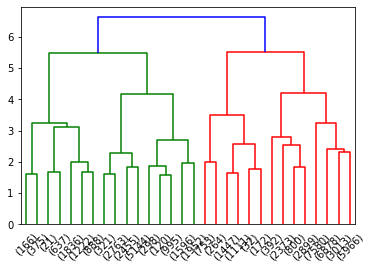

In [49]:
res = dendrogram(data_link, color_threshold=6, truncate_mode='lastp')

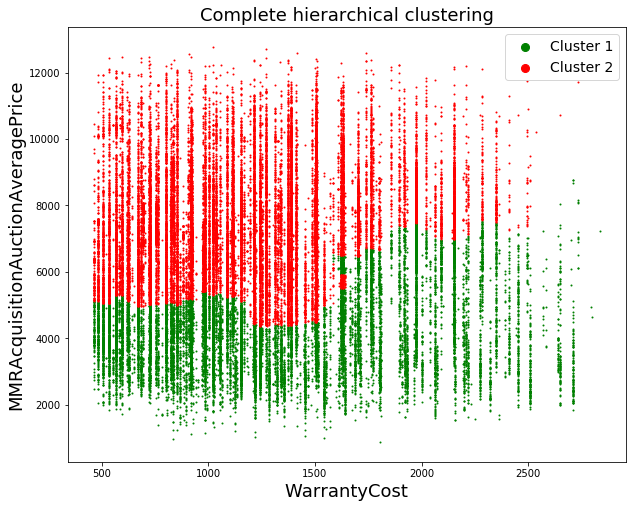

In [50]:
max_d = 6
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

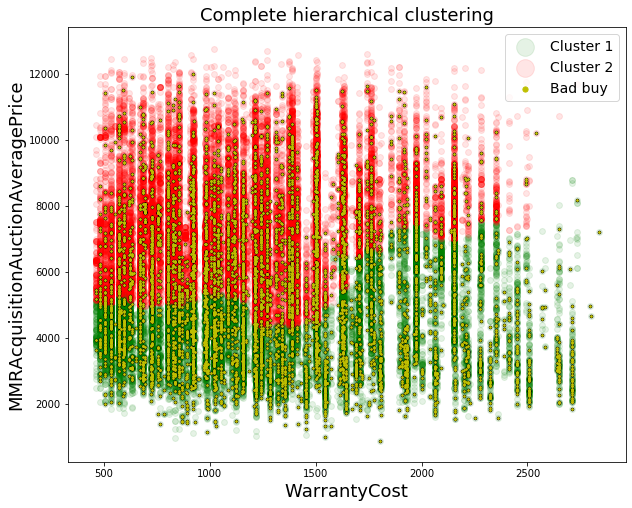

In [51]:
max_d = 6
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [52]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 20789 points
In details: 17208 good buys, and 3581 bad buys
So 17.23% of all the points of the cluster 1 are bad buys
This 3581 bad buys are 54.03% of all bad buys in the dataset

Cluster 2 has in total 33680 points
In details: 30633 good buys, and 3047 bad buys
So 9.05% of all the points of the cluster 2 are bad buys
This 3047 bad buys are 45.97% of all bad buys in the dataset



If we assume the theshold equal to 5, we will have FOUR clusters

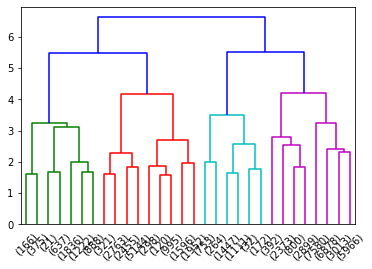

In [53]:
res = dendrogram(data_link, color_threshold=5, truncate_mode='lastp')

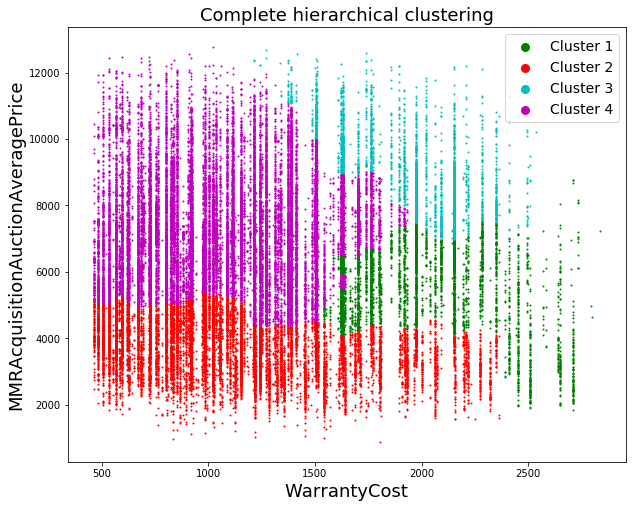

In [54]:
max_d = 5
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

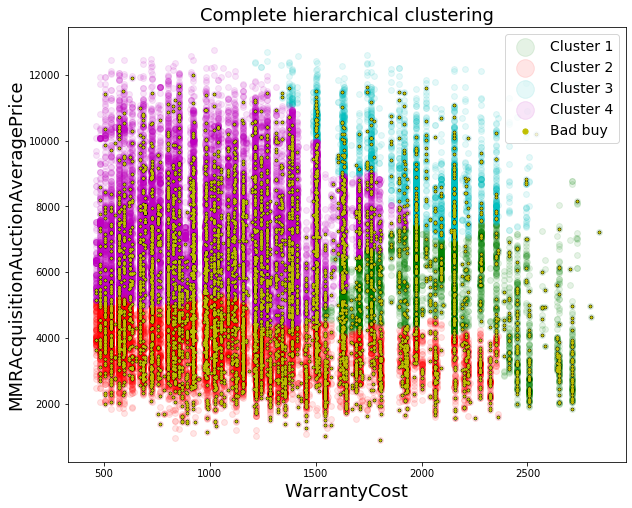

In [55]:
max_d = 5
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [56]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 5145 points
In details: 4372 good buys, and 773 bad buys
So 15.02% of all the points of the cluster 1 are bad buys
This 773 bad buys are 11.66% of all bad buys in the dataset

Cluster 2 has in total 15644 points
In details: 12836 good buys, and 2808 bad buys
So 17.95% of all the points of the cluster 2 are bad buys
This 2808 bad buys are 42.37% of all bad buys in the dataset

Cluster 3 has in total 3779 points
In details: 3514 good buys, and 265 bad buys
So 7.01% of all the points of the cluster 3 are bad buys
This 265 bad buys are 4.00% of all bad buys in the dataset

Cluster 4 has in total 29901 points
In details: 27119 good buys, and 2782 bad buys
So 9.30% of all the points of the cluster 4 are bad buys
This 2782 bad buys are 41.97% of all bad buys in the dataset



<b>Second hierarchical method: single</b>

In [80]:
data_link = linkage(data_dist, method='single', metric='euclidean')

With single method we have ONE cluster

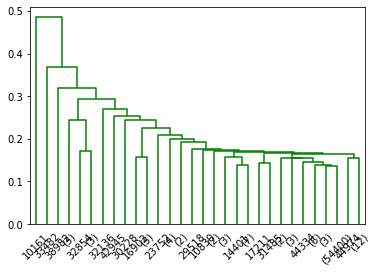

In [81]:
res = dendrogram(data_link, color_threshold=1.0, truncate_mode='lastp')

<b>Third hierarchical method: average</b>

In [57]:
data_link = linkage(data_dist, method='average', metric='euclidean')

If we assume the theshold equal to 2.5, we will have TWO clusters

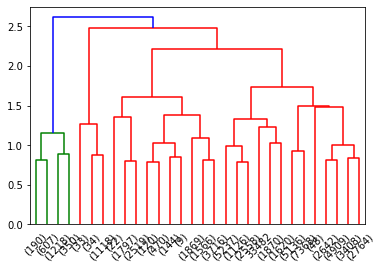

In [58]:
res = dendrogram(data_link, color_threshold=2.5, truncate_mode='lastp')

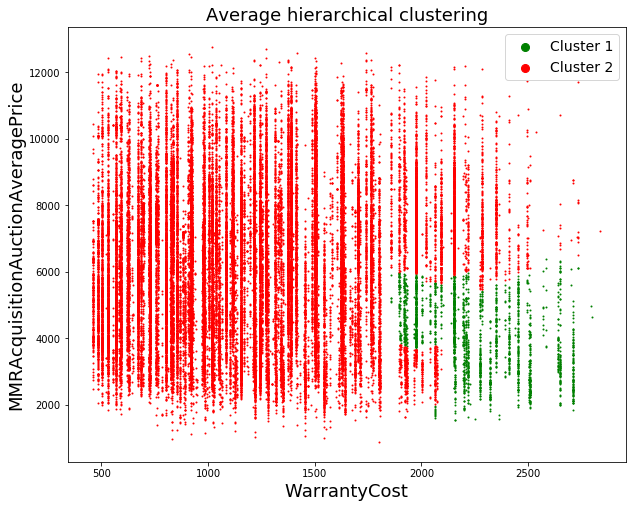

In [59]:
max_d = 2.5
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

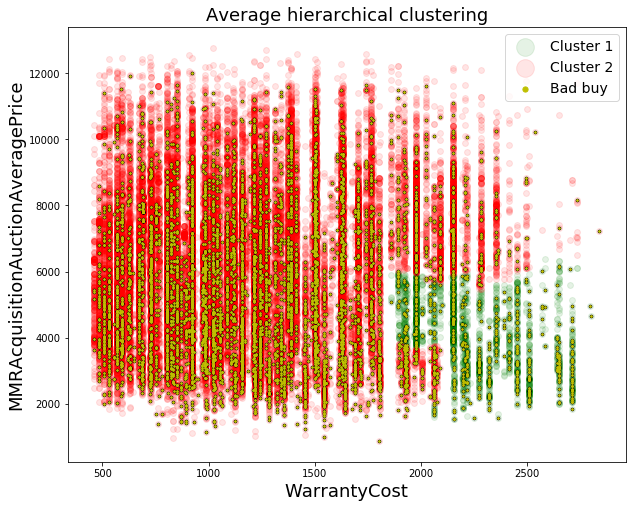

In [60]:
max_d = 2.5
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [61]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 2365 points
In details: 1790 good buys, and 575 bad buys
So 24.31% of all the points of the cluster 1 are bad buys
This 575 bad buys are 8.68% of all bad buys in the dataset

Cluster 2 has in total 52104 points
In details: 46051 good buys, and 6053 bad buys
So 11.62% of all the points of the cluster 2 are bad buys
This 6053 bad buys are 91.32% of all bad buys in the dataset



If we assume the theshold equal to 2.4, we will have THREE clusters

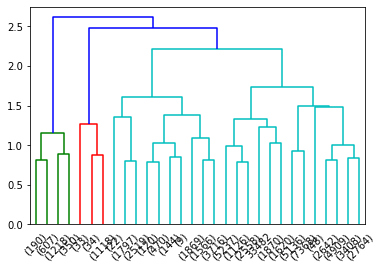

In [62]:
res = dendrogram(data_link, color_threshold=2.4, truncate_mode='lastp')

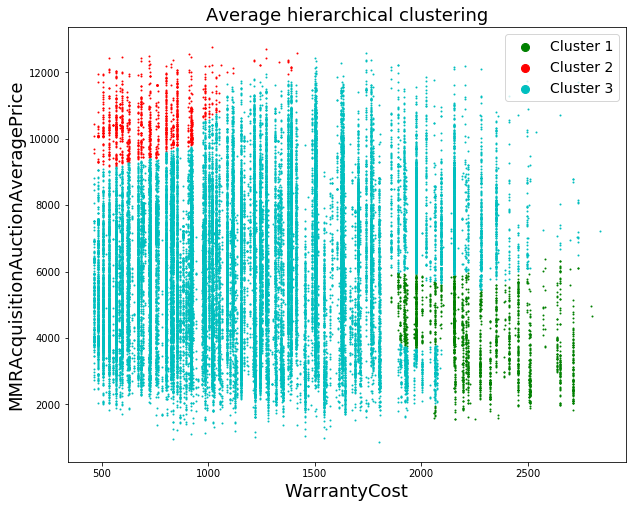

In [63]:
max_d = 2.4
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

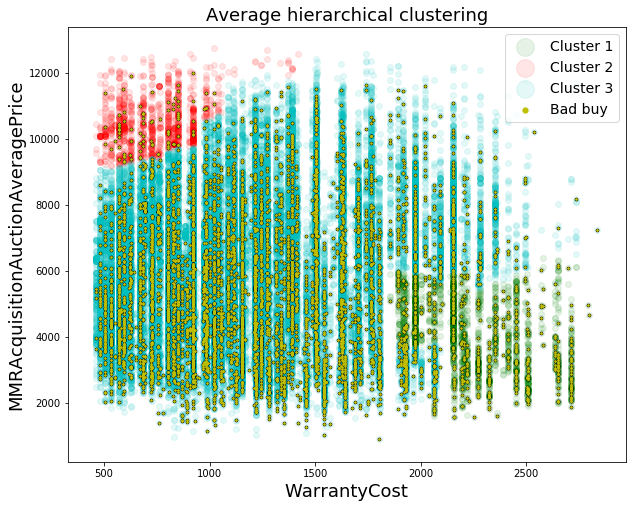

In [64]:
max_d = 2.4
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [65]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 2365 points
In details: 1790 good buys, and 575 bad buys
So 24.31% of all the points of the cluster 1 are bad buys
This 575 bad buys are 8.68% of all bad buys in the dataset

Cluster 2 has in total 1185 points
In details: 1097 good buys, and 88 bad buys
So 7.43% of all the points of the cluster 2 are bad buys
This 88 bad buys are 1.33% of all bad buys in the dataset

Cluster 3 has in total 50919 points
In details: 44954 good buys, and 5965 bad buys
So 11.71% of all the points of the cluster 3 are bad buys
This 5965 bad buys are 90.00% of all bad buys in the dataset



If we assume the theshold equal to 2.0, we will have FOUR clusters

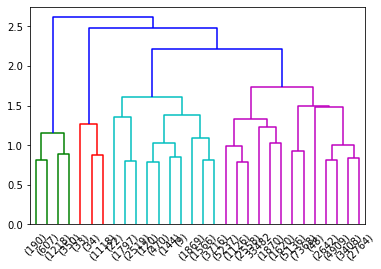

In [66]:
res = dendrogram(data_link, color_threshold=2.0, truncate_mode='lastp')

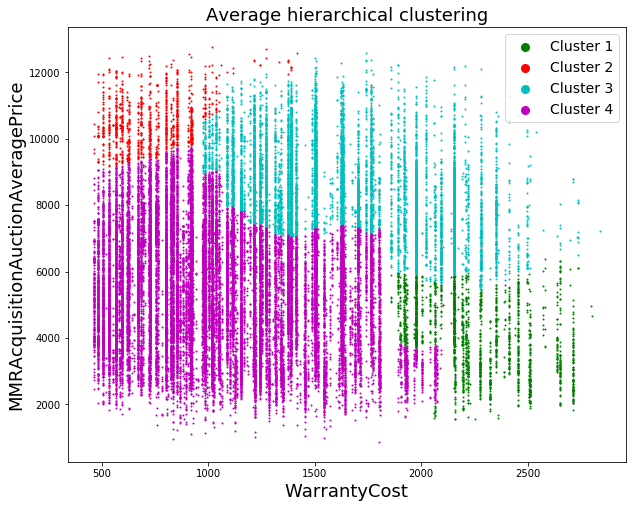

In [67]:
max_d = 2.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

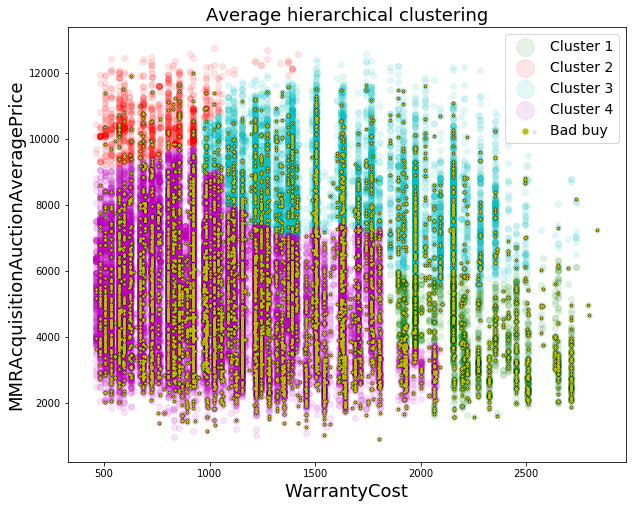

In [68]:
max_d = 2.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [69]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 2365 points
In details: 1790 good buys, and 575 bad buys
So 24.31% of all the points of the cluster 1 are bad buys
This 575 bad buys are 8.68% of all bad buys in the dataset

Cluster 2 has in total 1185 points
In details: 1097 good buys, and 88 bad buys
So 7.43% of all the points of the cluster 2 are bad buys
This 88 bad buys are 1.33% of all bad buys in the dataset

Cluster 3 has in total 12232 points
In details: 11195 good buys, and 1037 bad buys
So 8.48% of all the points of the cluster 3 are bad buys
This 1037 bad buys are 15.65% of all bad buys in the dataset

Cluster 4 has in total 38687 points
In details: 33759 good buys, and 4928 bad buys
So 12.74% of all the points of the cluster 4 are bad buys
This 4928 bad buys are 74.35% of all bad buys in the dataset



If we assume the theshold equal to 1.5, we will have SIX clusters

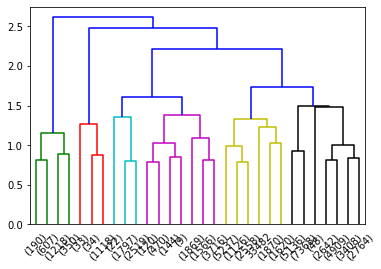

In [70]:
res = dendrogram(data_link, color_threshold=1.5, truncate_mode='lastp')

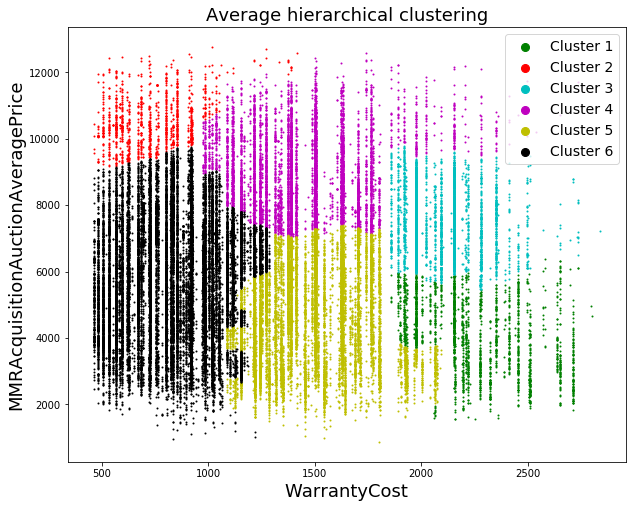

In [71]:
max_d = 1.5
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm',
                   5 : 'y',
                   6 : 'k'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

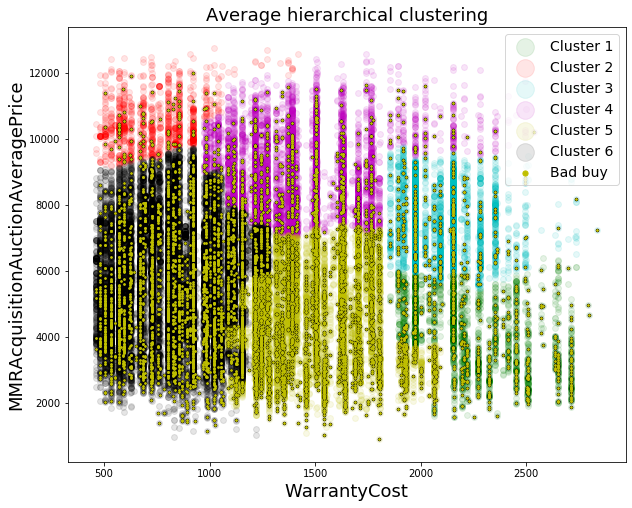

In [72]:
max_d = 1.5
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm',
                   5 : 'y',
                   6 : 'k'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# WarrantyCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [73]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 2365 points
In details: 1790 good buys, and 575 bad buys
So 24.31% of all the points of the cluster 1 are bad buys
This 575 bad buys are 8.68% of all bad buys in the dataset

Cluster 2 has in total 1185 points
In details: 1097 good buys, and 88 bad buys
So 7.43% of all the points of the cluster 2 are bad buys
This 88 bad buys are 1.33% of all bad buys in the dataset

Cluster 3 has in total 4338 points
In details: 3988 good buys, and 350 bad buys
So 8.07% of all the points of the cluster 3 are bad buys
This 350 bad buys are 5.28% of all bad buys in the dataset

Cluster 4 has in total 7894 points
In details: 7207 good buys, and 687 bad buys
So 8.70% of all the points of the cluster 4 are bad buys
This 687 bad buys are 10.37% of all bad buys in the dataset

Cluster 5 has in total 12412 points
In details: 10348 good buys, and 2064 bad buys
So 16.63% of all the points of the cluster 5 are bad buys
This 2064 bad buys are 31.14% of all bad buys in the dataset

Cluster 6

# Graphics with WarrantyCost and VehBCost

In [6]:
X = df[["WarrantyCost", "VehBCost"]]

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

For all hierarchical methods we use the same distance metric: euclidean

In [7]:
data_dist = pdist(X, metric='euclidean')

<b>First hierarchical method: complete</b>

In [8]:
data_link = linkage(data_dist, method='complete', metric='euclidean')

If we assume the theshold equal to 6.0, we will have TWO clusters

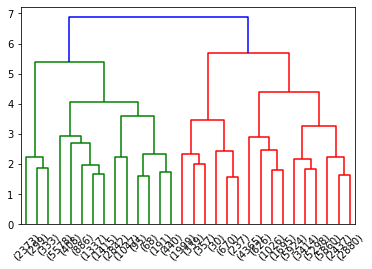

In [9]:
res = dendrogram(data_link, color_threshold=6.0, truncate_mode='lastp')

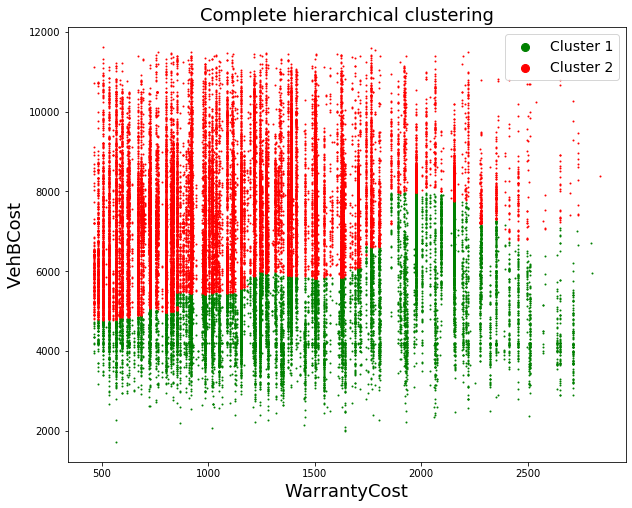

In [10]:
max_d = 6.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

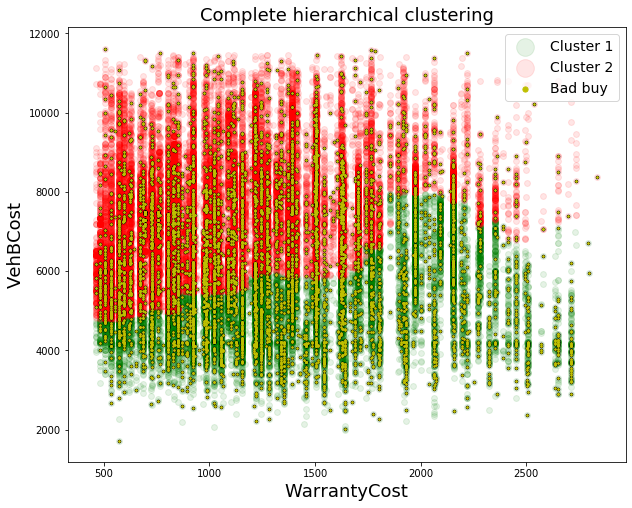

In [11]:
max_d = 6.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [12]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 17312 points
In details: 14319 good buys, and 2993 bad buys
So 17.29% of all the points of the cluster 1 are bad buys
This 2993 bad buys are 45.16% of all bad buys in the dataset

Cluster 2 has in total 37157 points
In details: 33522 good buys, and 3635 bad buys
So 9.78% of all the points of the cluster 2 are bad buys
This 3635 bad buys are 54.84% of all bad buys in the dataset



If we assume the theshold equal to 5.0, we will have FOUR clusters

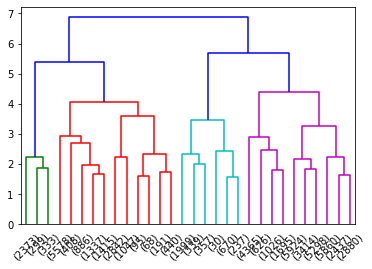

In [13]:
res = dendrogram(data_link, color_threshold=5.0, truncate_mode='lastp')

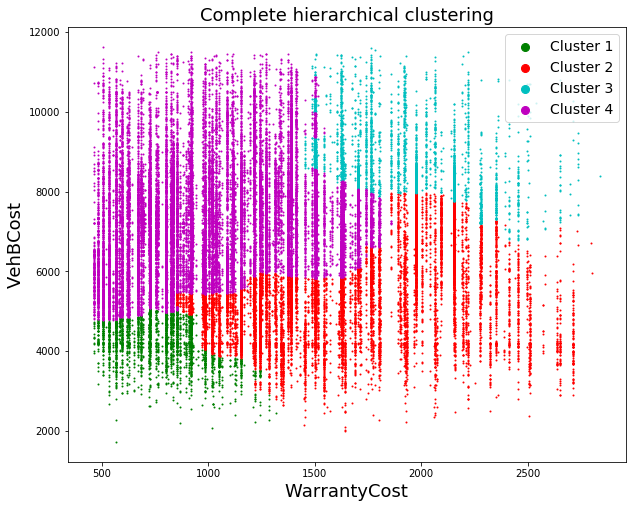

In [14]:
max_d = 5.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

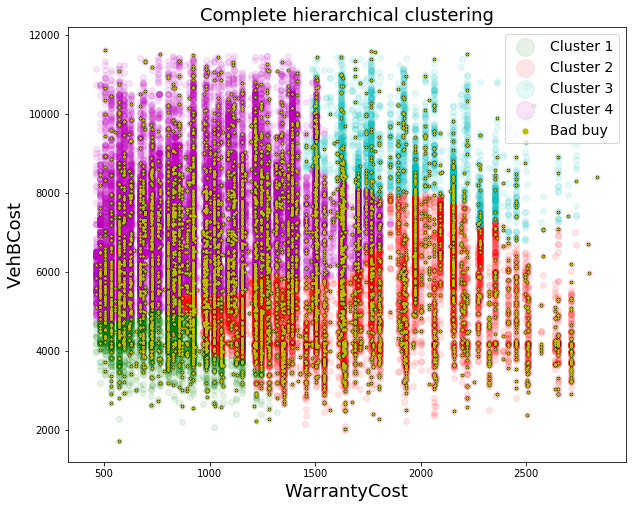

In [15]:
max_d = 5.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [16]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 3005 points
In details: 2456 good buys, and 549 bad buys
So 18.27% of all the points of the cluster 1 are bad buys
This 549 bad buys are 8.28% of all bad buys in the dataset

Cluster 2 has in total 14307 points
In details: 11863 good buys, and 2444 bad buys
So 17.08% of all the points of the cluster 2 are bad buys
This 2444 bad buys are 36.87% of all bad buys in the dataset

Cluster 3 has in total 3632 points
In details: 3248 good buys, and 384 bad buys
So 10.57% of all the points of the cluster 3 are bad buys
This 384 bad buys are 5.79% of all bad buys in the dataset

Cluster 4 has in total 33525 points
In details: 30274 good buys, and 3251 bad buys
So 9.70% of all the points of the cluster 4 are bad buys
This 3251 bad buys are 49.05% of all bad buys in the dataset



<b>Second hierarchical method: single</b>

In [103]:
data_link = linkage(data_dist, method='single', metric='euclidean')

With single method we have ONE cluster

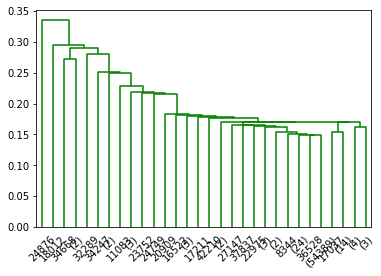

In [104]:
res = dendrogram(data_link, color_threshold=1.0, truncate_mode='lastp')

<b>Third hierarchical method: average</b>

In [17]:
data_link = linkage(data_dist, method='average', metric='euclidean')

If we assume the theshold equal to 2.4, we will have TWO clusters

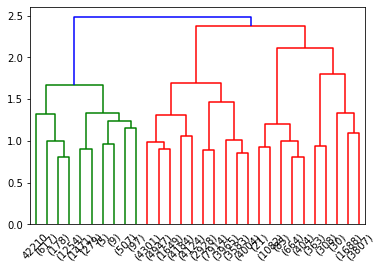

In [18]:
res = dendrogram(data_link, color_threshold=2.4, truncate_mode='lastp')

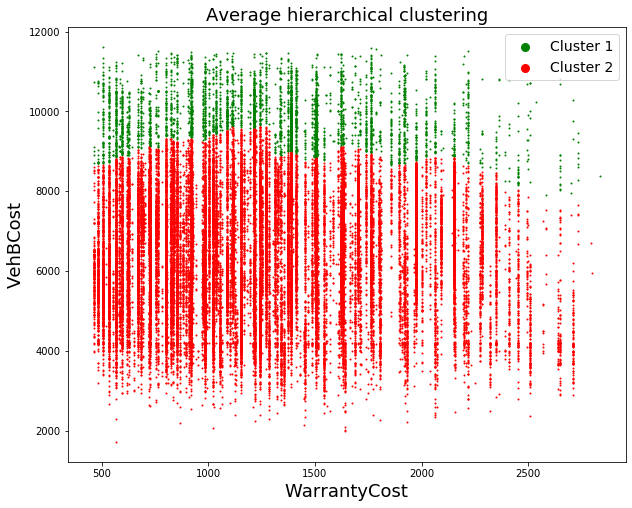

In [19]:
max_d = 2.4
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

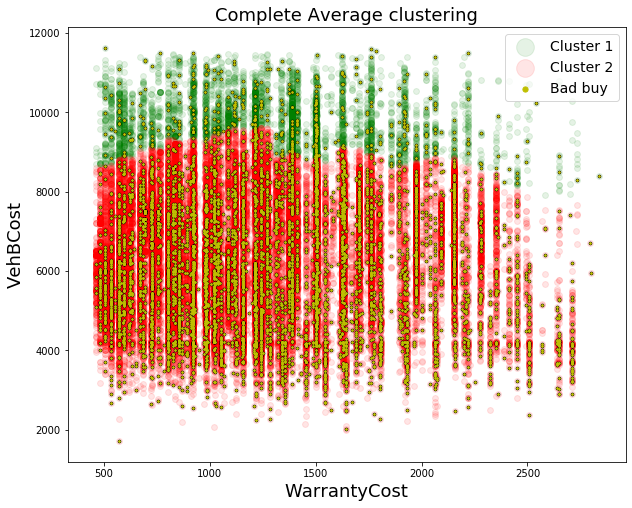

In [20]:
max_d = 2.4
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

plt.figure(figsize=(10, 8))
plt.title('Complete Average clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [21]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 4418 points
In details: 3953 good buys, and 465 bad buys
So 10.53% of all the points of the cluster 1 are bad buys
This 465 bad buys are 7.02% of all bad buys in the dataset

Cluster 2 has in total 50051 points
In details: 43888 good buys, and 6163 bad buys
So 12.31% of all the points of the cluster 2 are bad buys
This 6163 bad buys are 92.98% of all bad buys in the dataset



If we assume the theshold equal to 2.3, we will have THREE clusters

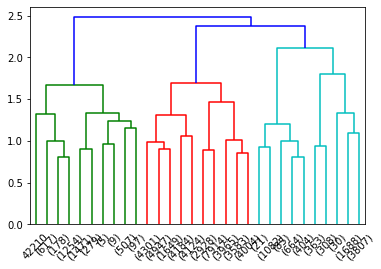

In [22]:
res = dendrogram(data_link, color_threshold=2.3, truncate_mode='lastp')

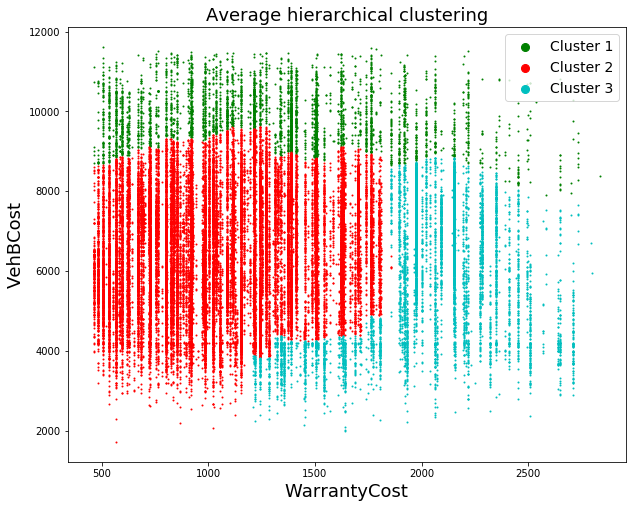

In [23]:
max_d = 2.3
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

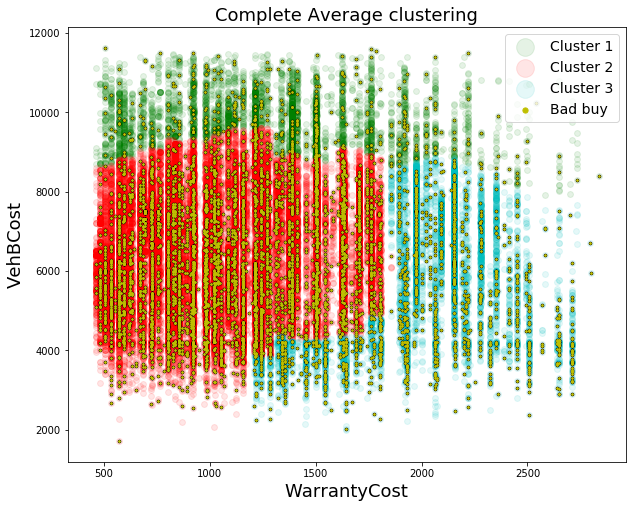

In [24]:
max_d = 2.3
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

plt.figure(figsize=(10, 8))
plt.title('Complete Average clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [25]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 4418 points
In details: 3953 good buys, and 465 bad buys
So 10.53% of all the points of the cluster 1 are bad buys
This 465 bad buys are 7.02% of all bad buys in the dataset

Cluster 2 has in total 41599 points
In details: 36874 good buys, and 4725 bad buys
So 11.36% of all the points of the cluster 2 are bad buys
This 4725 bad buys are 71.29% of all bad buys in the dataset

Cluster 3 has in total 8452 points
In details: 7014 good buys, and 1438 bad buys
So 17.01% of all the points of the cluster 3 are bad buys
This 1438 bad buys are 21.70% of all bad buys in the dataset



If we assume the theshold equal to 2.0, we will have FOUR clusters

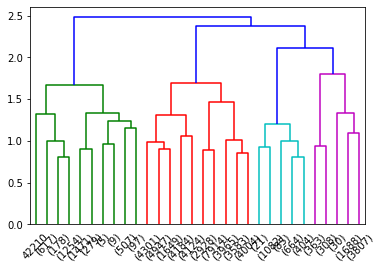

In [26]:
res = dendrogram(data_link, color_threshold=2.0, truncate_mode='lastp')

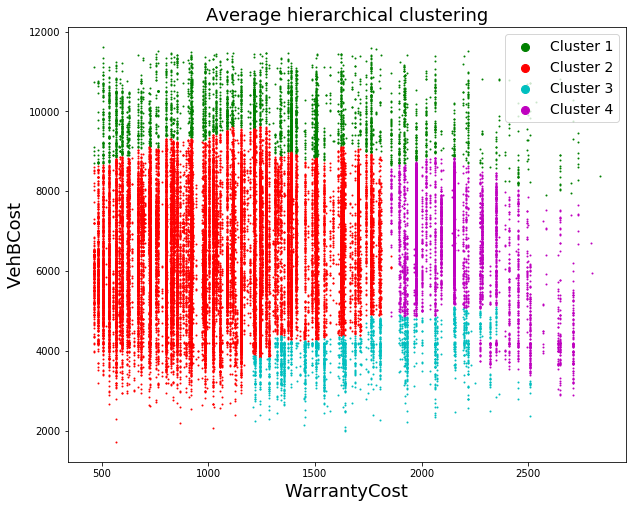

In [27]:
max_d = 2.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and WarrantyCost on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=1, label='Cluster %s' % i)
plt.legend(loc="upper right", fontsize = 14, markerscale = 8)    
plt.show()

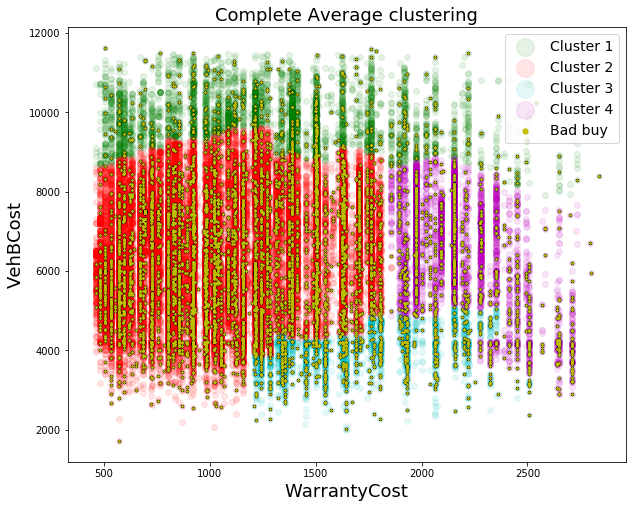

In [28]:
max_d = 2.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

plt.figure(figsize=(10, 8))
plt.title('Complete Average clustering', fontsize=18)
plt.xlabel('WarrantyCost', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['WarrantyCost'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['WarrantyCost'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper right", fontsize = 14, markerscale = 3)    
plt.show()

In [29]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 4418 points
In details: 3953 good buys, and 465 bad buys
So 10.53% of all the points of the cluster 1 are bad buys
This 465 bad buys are 7.02% of all bad buys in the dataset

Cluster 2 has in total 41599 points
In details: 36874 good buys, and 4725 bad buys
So 11.36% of all the points of the cluster 2 are bad buys
This 4725 bad buys are 71.29% of all bad buys in the dataset

Cluster 3 has in total 2256 points
In details: 1617 good buys, and 639 bad buys
So 28.32% of all the points of the cluster 3 are bad buys
This 639 bad buys are 9.64% of all bad buys in the dataset

Cluster 4 has in total 6196 points
In details: 5397 good buys, and 799 bad buys
So 12.90% of all the points of the cluster 4 are bad buys
This 799 bad buys are 12.05% of all bad buys in the dataset



# Graphics with VehBCost and MMRAcquisitionAuctionAveragePrice 

In [30]:
X = df[["VehBCost", "MMRAcquisitionAuctionAveragePrice"]]

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

For all hierarchical methods we use the same distance metric: euclidean

In [31]:
data_dist = pdist(X, metric='euclidean')

<b>First hierarchical method: complete</b>

In [32]:
data_link = linkage(data_dist, method='complete', metric='euclidean')

If we assume the theshold equal to 6.0, we will have TWO clusters

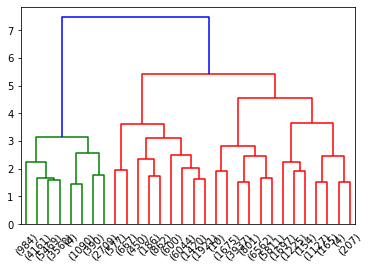

In [33]:
res = dendrogram(data_link, color_threshold=6.0, truncate_mode='lastp')

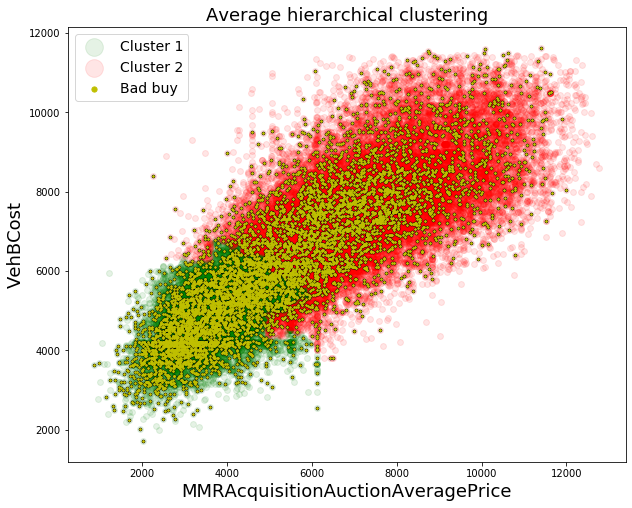

In [34]:
max_d = 6.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

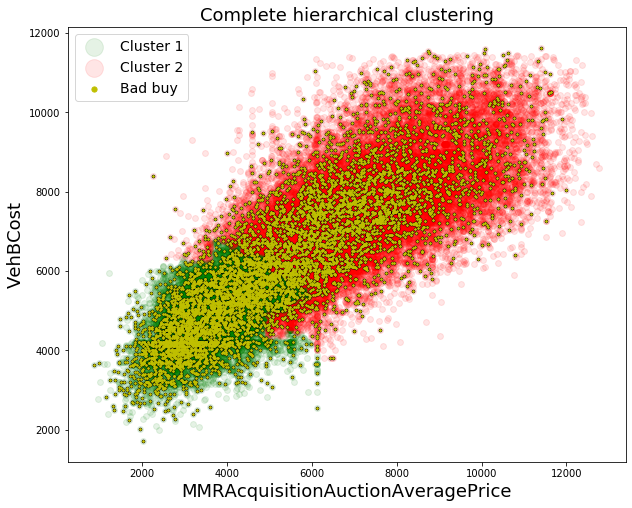

In [35]:
max_d = 6.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

In [36]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 18367 points
In details: 15113 good buys, and 3254 bad buys
So 17.72% of all the points of the cluster 1 are bad buys
This 3254 bad buys are 49.09% of all bad buys in the dataset

Cluster 2 has in total 36102 points
In details: 32728 good buys, and 3374 bad buys
So 9.35% of all the points of the cluster 2 are bad buys
This 3374 bad buys are 50.91% of all bad buys in the dataset



If we assume the theshold equal to 5.0, we will have THREE clusters

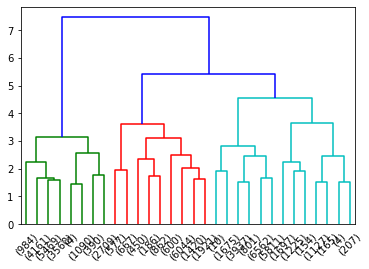

In [37]:
res = dendrogram(data_link, color_threshold=5.0, truncate_mode='lastp')

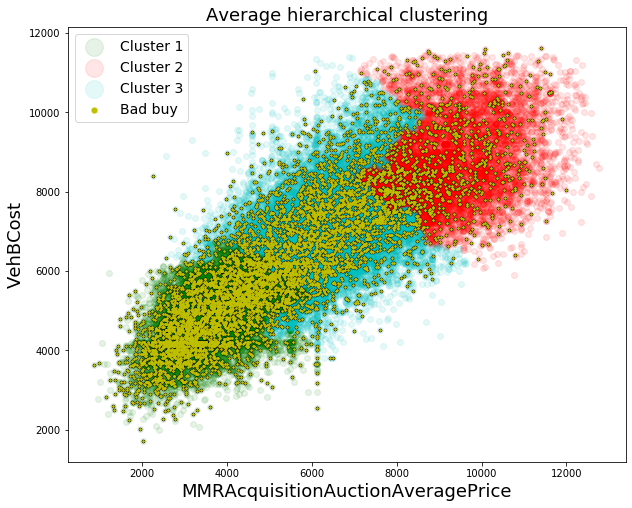

In [38]:
max_d = 5.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

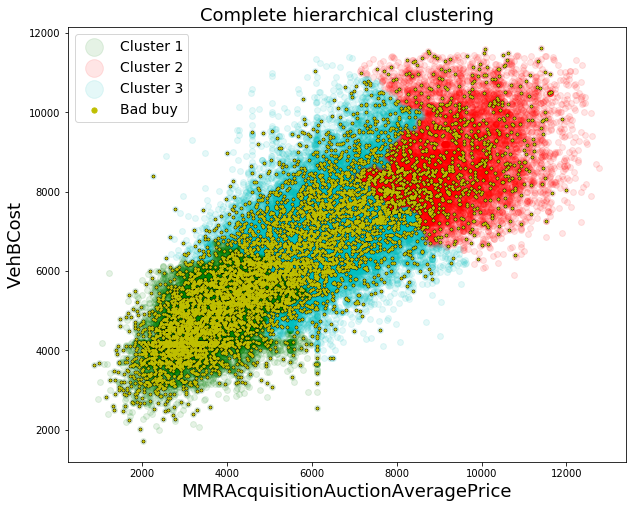

In [39]:
max_d = 5.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

In [40]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 18367 points
In details: 15113 good buys, and 3254 bad buys
So 17.72% of all the points of the cluster 1 are bad buys
This 3254 bad buys are 49.09% of all bad buys in the dataset

Cluster 2 has in total 12727 points
In details: 11750 good buys, and 977 bad buys
So 7.68% of all the points of the cluster 2 are bad buys
This 977 bad buys are 14.74% of all bad buys in the dataset

Cluster 3 has in total 23375 points
In details: 20978 good buys, and 2397 bad buys
So 10.25% of all the points of the cluster 3 are bad buys
This 2397 bad buys are 36.16% of all bad buys in the dataset



If we assume the theshold equal to 4.0, we will have FOUR clusters

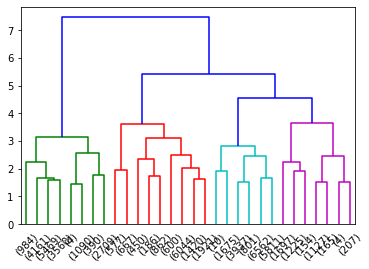

In [41]:
res = dendrogram(data_link, color_threshold=4.0, truncate_mode='lastp')

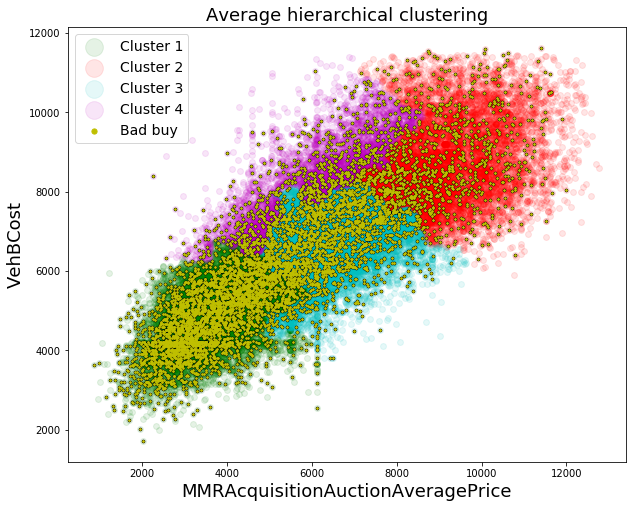

In [42]:
max_d = 4.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

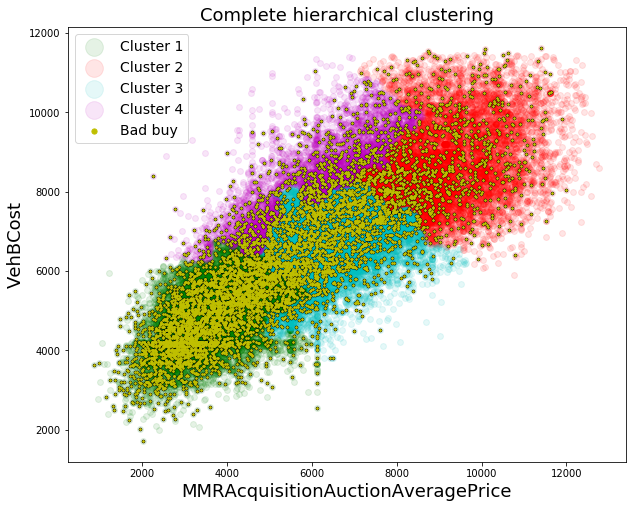

In [43]:
max_d = 4.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Complete hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

In [44]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 18367 points
In details: 15113 good buys, and 3254 bad buys
So 17.72% of all the points of the cluster 1 are bad buys
This 3254 bad buys are 49.09% of all bad buys in the dataset

Cluster 2 has in total 12727 points
In details: 11750 good buys, and 977 bad buys
So 7.68% of all the points of the cluster 2 are bad buys
This 977 bad buys are 14.74% of all bad buys in the dataset

Cluster 3 has in total 18796 points
In details: 17031 good buys, and 1765 bad buys
So 9.39% of all the points of the cluster 3 are bad buys
This 1765 bad buys are 26.63% of all bad buys in the dataset

Cluster 4 has in total 4579 points
In details: 3947 good buys, and 632 bad buys
So 13.80% of all the points of the cluster 4 are bad buys
This 632 bad buys are 9.54% of all bad buys in the dataset



<b>Second hierarchical method: single</b>

In [116]:
data_link = linkage(data_dist, method='single', metric='euclidean')

With single method we have ONE cluster

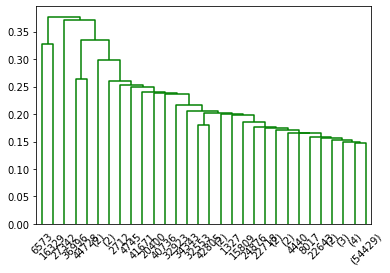

In [117]:
res = dendrogram(data_link, color_threshold=1.0, truncate_mode='lastp')

<b>Third hierarchical method: average</b>

In [45]:
data_link = linkage(data_dist, method='average', metric='euclidean')

If we assume the theshold equal to 2.0, we will have TWO clusters

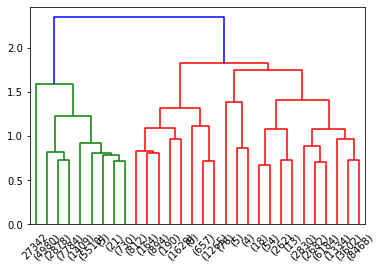

In [46]:
res = dendrogram(data_link, color_threshold=2.0, truncate_mode='lastp')

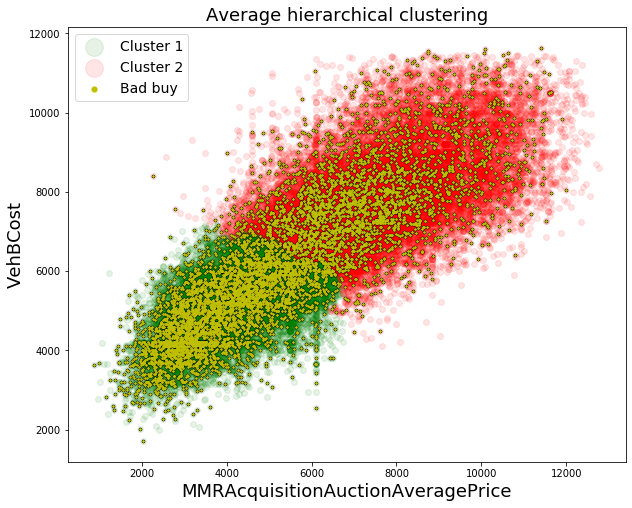

In [47]:
max_d = 2.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

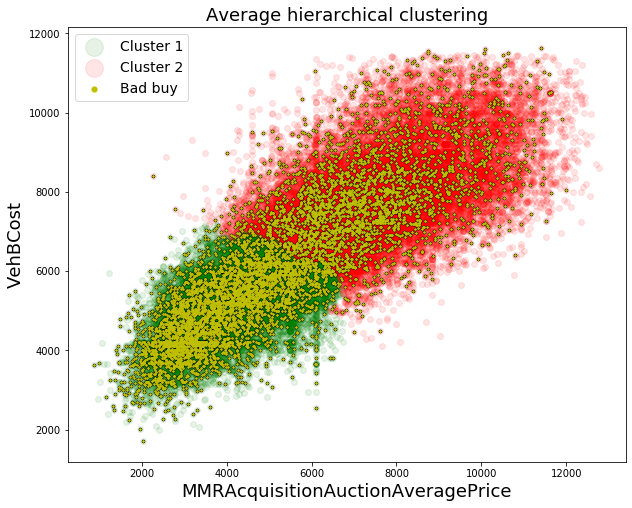

In [48]:
max_d = 2.0
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

In [49]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 23318 points
In details: 19469 good buys, and 3849 bad buys
So 16.51% of all the points of the cluster 1 are bad buys
This 3849 bad buys are 58.07% of all bad buys in the dataset

Cluster 2 has in total 31151 points
In details: 28372 good buys, and 2779 bad buys
So 8.92% of all the points of the cluster 2 are bad buys
This 2779 bad buys are 41.93% of all bad buys in the dataset



If we assume the theshold equal to 1.8, we will have THREE clusters

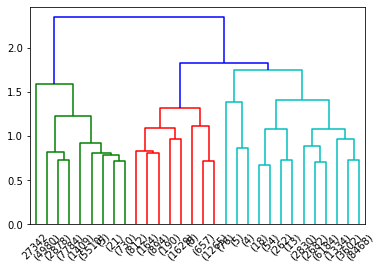

In [50]:
res = dendrogram(data_link, color_threshold=1.8, truncate_mode='lastp')

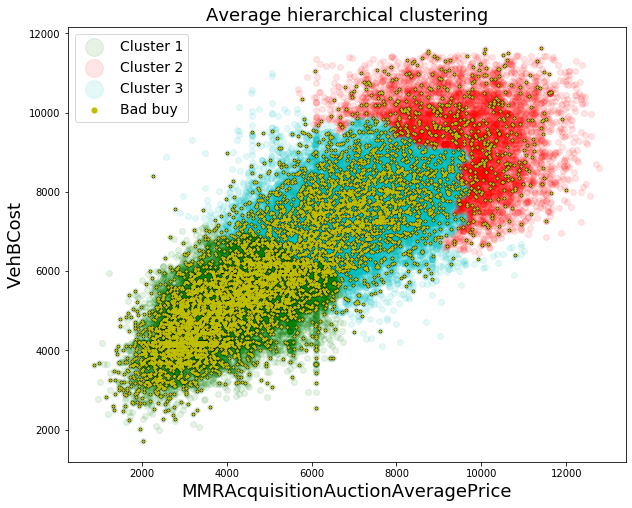

In [51]:
max_d = 1.8
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

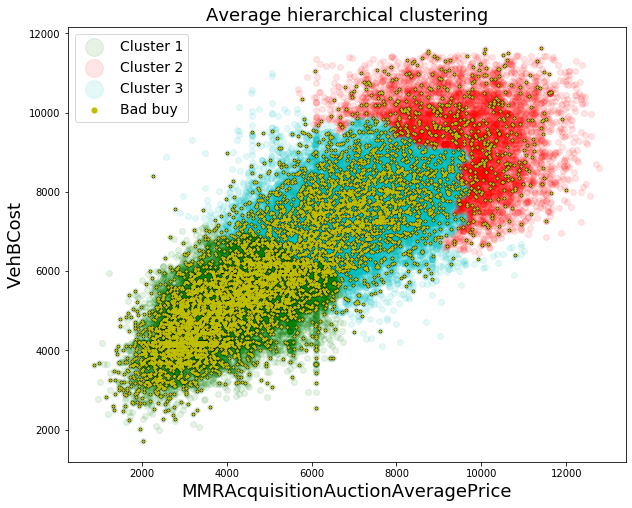

In [52]:
max_d = 1.8
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

In [53]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 23318 points
In details: 19469 good buys, and 3849 bad buys
So 16.51% of all the points of the cluster 1 are bad buys
This 3849 bad buys are 58.07% of all bad buys in the dataset

Cluster 2 has in total 5619 points
In details: 5116 good buys, and 503 bad buys
So 8.95% of all the points of the cluster 2 are bad buys
This 503 bad buys are 7.59% of all bad buys in the dataset

Cluster 3 has in total 25532 points
In details: 23256 good buys, and 2276 bad buys
So 8.91% of all the points of the cluster 3 are bad buys
This 2276 bad buys are 34.34% of all bad buys in the dataset



If we assume the theshold equal to 1.6, we will have FOUR clusters

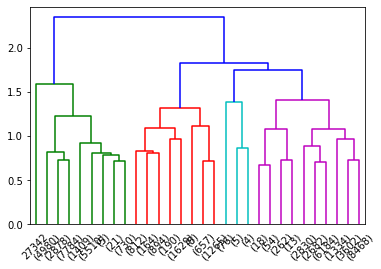

In [54]:
res = dendrogram(data_link, color_threshold=1.6, truncate_mode='lastp')

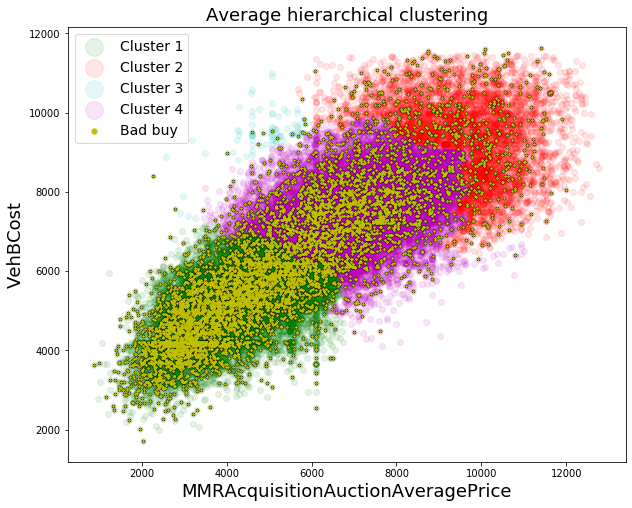

In [55]:
max_d = 1.6
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

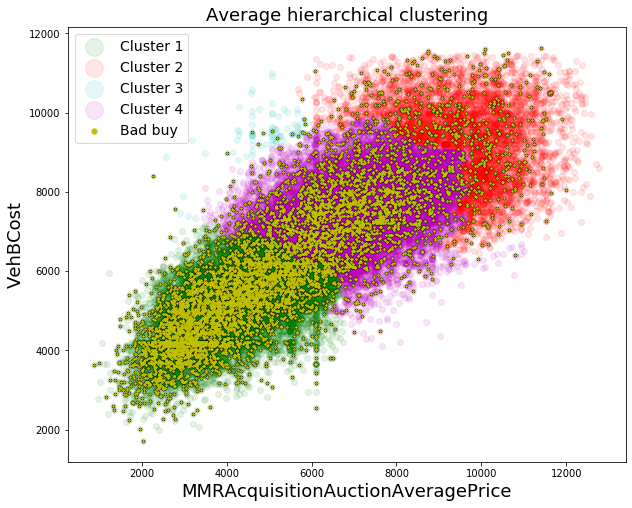

In [56]:
max_d = 1.6
LABEL_COLOR_MAP = {1 : 'g',
                   2 : 'r',
                   3 : 'c',
                   4 : 'm'
                   }
clusters = fcluster(data_link, max_d, criterion='distance')
num_clusters = len(np.unique(clusters))
hierarchical_clusters = {i: np.where(clusters == i)[0] for i in range(1, num_clusters+1)}
isBadBuy_clusters = {i: np.where(df["IsBadBuy"] == i)[0] for i in range(2)}

# VehBCost and MMR on the plot
plt.figure(figsize=(10, 8))
plt.title('Average hierarchical clustering', fontsize=18)
plt.xlabel('MMRAcquisitionAuctionAveragePrice', fontsize=18)
plt.ylabel('VehBCost', fontsize=18)
for i in range(1, num_clusters+1):
    plt.scatter(df.iloc[hierarchical_clusters[i]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[hierarchical_clusters[i]]['VehBCost'], c=LABEL_COLOR_MAP[i], s=35, alpha=0.1, label='Cluster %s' % i)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='k', s=7)
plt.scatter(df.iloc[isBadBuy_clusters[1]]['MMRAcquisitionAuctionAveragePrice'], df.iloc[isBadBuy_clusters[1]]['VehBCost'], c='y', s=3, label='Bad buy')
plt.legend(loc="upper left", fontsize = 14, markerscale = 3)    
plt.show()

In [57]:
numBadBuy = df["IsBadBuy"].value_counts()[1]
for i in range(1, num_clusters + 1):
    absolute_values = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()
    num_values = absolute_values[0] + absolute_values[1]
    percentage = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts(normalize=True)
    percentage_of_bad_buys = df.iloc[hierarchical_clusters[i]]["IsBadBuy"].value_counts()[1]*1.0 / numBadBuy
    print("Cluster " + str(i) + " has in total " + str(num_values) + " points")
    print("In details: " + str(absolute_values[0]) + " good buys, and " + str(absolute_values[1]) + " bad buys")
    print("So " + str("%.2f" % (percentage[1] * 100)) + "% of all the points of the cluster " + str(i) + " are bad buys")
    print("This " + str(absolute_values[1]) + " bad buys are " + str("%.2f" % (percentage_of_bad_buys*100)) + "% of all bad buys in the dataset")
    print()

Cluster 1 has in total 23318 points
In details: 19469 good buys, and 3849 bad buys
So 16.51% of all the points of the cluster 1 are bad buys
This 3849 bad buys are 58.07% of all bad buys in the dataset

Cluster 2 has in total 5619 points
In details: 5116 good buys, and 503 bad buys
So 8.95% of all the points of the cluster 2 are bad buys
This 503 bad buys are 7.59% of all bad buys in the dataset

Cluster 3 has in total 85 points
In details: 71 good buys, and 14 bad buys
So 16.47% of all the points of the cluster 3 are bad buys
This 14 bad buys are 0.21% of all bad buys in the dataset

Cluster 4 has in total 25447 points
In details: 23185 good buys, and 2262 bad buys
So 8.89% of all the points of the cluster 4 are bad buys
This 2262 bad buys are 34.13% of all bad buys in the dataset

